# EDA | HuBMAP - Hacking the Human Vasculature Competition

## Import Statements

In [1]:
# For data processing
import numpy as np
import pandas as pd
import json
from pathlib import Path
import PIL
import skimage
from shapely.geometry import LinearRing as ShapelyContour
from shapely.geometry import Polygon as ShapelyPolygon

In [2]:
# For visualization
import plotly
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt

## Setting Global Variables

In [3]:
# For reproducibility
seed = 123
np.random.seed(seed)

In [4]:
TRAIN_DIR = "/kaggle/input/hubmap-hacking-the-human-vasculature/train"
TEST_DIR = "/kaggle/input/hubmap-hacking-the-human-vasculature/test"
ANNOT_PATH = "/kaggle/input/hubmap-hacking-the-human-vasculature/polygons.jsonl"
WSI_TILE_CSV = "/kaggle/input/hubmap-hacking-the-human-vasculature/tile_meta.csv"
IMG_SIZE = 512
IMG_EXT = "tif"

In [5]:
train_ids = [path.stem for path in Path(TRAIN_DIR).glob(f"*.{IMG_EXT}")]
print(f"{len(train_ids)} Public Train Image Available")

7033 Public Train Image Available


In [6]:
hidden_test_ids = [path.stem for path in Path(TEST_DIR).glob(f"*.{IMG_EXT}")]
print(f"{len(hidden_test_ids)} Public Test Image Available")

1 Public Test Image Available


In [7]:
class_names = ["background", "blood_vessel", "glomerulus", "unsure"]
class_color_dict = {
    "blood_vessel": "red",
    "glomerulus": "green",
    "unsure": "blue",
}

In [8]:
wsi_df = pd.read_csv(WSI_TILE_CSV)
# Tiles with Annotations
dataset12_ids = wsi_df[wsi_df["dataset"] != 3].id.values.tolist() 
# Tiles with Expert Reviewed Annotations
dataset1_ids = wsi_df[wsi_df["dataset"] == 1].id.values.tolist()
# Tiles with Sparse Annotations
dataset2_ids = wsi_df[wsi_df["dataset"] == 2].id.values.tolist()
# Tiles without Annotations
dataset3_ids = wsi_df[wsi_df["dataset"] == 3].id.values.tolist() 

## Load and clean annotations

In [9]:
def load_annotations(annotations_path=ANNOT_PATH):
    
    annotations = {}
    duplicates_ids = []

    with open(annotations_path, "r") as f:
        for line in f:
            entry = json.loads(line)
            identifier = entry["id"]
            annotations_list = entry["annotations"]

            revised_annotations = [] # [[label_str, polygon_list], ...]

            for annotation in annotations_list:
                label = annotation["type"]
                polygon = annotation["coordinates"][0]

                # Remove Duplicates
                if not any(ShapelyContour(p).equals(ShapelyContour(polygon)) \
                           and l==label for l, p in revised_annotations):
                    revised_annotations.append([label, polygon])

            if len(annotations_list) != len(revised_annotations):
                duplicates_ids.append(identifier)

            annotations[identifier] = revised_annotations
            
    return annotations, duplicates_ids

In [10]:
annotations, duplicates_ids = load_annotations()

# Sanity check
assert len(annotations) == len(dataset12_ids)

In [11]:
def show_tile(identifier, annotations, color_dict,
              properties_list = ['area', 'eccentricity']):
    
    path = Path(TRAIN_DIR) / f"{identifier}.{IMG_EXT}"
    img = PIL.Image.open(path).convert("RGB")
    
    fig = px.imshow(img, binary_string=True)
    fig.update_traces(hoverinfo='skip')
    fig.update_layout(width=IMG_SIZE, height=IMG_SIZE, 
                      margin=dict(l=0,r=0,b=0,t=0))
    fig.update_xaxes(showticklabels=False)
    fig.update_yaxes(showticklabels=False)
    
    if identifier in annotations.keys():
        for label_id, (label, polygon) in enumerate(annotations[identifier]):

            mask = skimage.draw.polygon2mask((IMG_SIZE, IMG_SIZE), polygon)
            properties = skimage.measure.regionprops(mask.astype(np.uint8))[0]

            hoverinfo = f'<b>label: {label}</b><br>' 
            for property_name in properties_list:
                hoverinfo += f'<b>{property_name}: {properties[property_name]:.2f}</b><br>' 

            x, y = zip(*polygon)
            fig.add_trace(
                go.Scatter(x=x, y=y, name=label_id, mode='lines', fill='toself', 
                           showlegend=False, hovertemplate=hoverinfo, hoveron='points+fills',
                           line={"color": color_dict[label]}, opacity=0.5)
            )    
    fig.show()

In [12]:
show_tile(np.random.choice(dataset1_ids), annotations, class_color_dict)

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning:

A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5



In [13]:
def show_tiles(identifiers, annotations=None, color_dict=None, 
               nrows=5, ncols=6, divide_by=4 ,
               properties_list = ['area', 'eccentricity']):
    
    fig = make_subplots(rows=nrows, cols=ncols,
                        shared_xaxes=True, shared_yaxes=True, 
                        horizontal_spacing=0, vertical_spacing=0,
                        subplot_titles=identifiers[:nrows * ncols])
    fig.update_layout(width=IMG_SIZE*ncols/divide_by,
                      height=IMG_SIZE*nrows/divide_by,
                      margin=dict(l=0,r=0,b=0,t=0))
    fig.update_xaxes(showticklabels=False)
    fig.update_yaxes(showticklabels=False)
    
    for i in range(nrows * ncols):
        
        identifier = identifiers[i]
        path = Path(TRAIN_DIR) / f"{identifier}.{IMG_EXT}"
        img = PIL.Image.open(path).convert("RGB")

        fig_bgd = px.imshow(img, binary_string=True)
        fig_bgd.update_traces(hoverinfo='skip')

        fig.add_trace(fig_bgd.data[0], row=1+i//ncols, col=1+i%ncols) 
        
        if annotations is not None and identifier in annotations.keys():
            for label_id, (label, polygon) in enumerate(annotations[identifier]):

                mask = skimage.draw.polygon2mask((IMG_SIZE, IMG_SIZE), polygon)
                properties = skimage.measure.regionprops(mask.astype(np.uint8))[0]

                hoverinfo = f'<b>label: {label}</b><br>' 
                for property_name in properties_list:
                    hoverinfo += f'<b>{property_name}: {properties[property_name]:.2f}</b><br>' 

                x, y = zip(*polygon)
                fig.add_trace(
                    go.Scatter(x=x, y=y, name=label_id, mode='lines', fill='toself', 
                               showlegend=False, hovertemplate=hoverinfo, hoveron='points+fills',
                               line={"color": color_dict[label]}, opacity=0.5),
                    row=1+i//ncols, col=1+i%ncols
                )

    fig.update_annotations(yshift=-40, bgcolor ='rgba(255,255,255,0.75)')

    fig.show()

In [14]:
def clean_annotations(annotations):
    new_annotations = {}
    anomalies_ids = []

    for identifier in annotations.keys():

        annotations_list = annotations[identifier]
        revised_annotations = []
        skip = False

        for (label, polygon) in annotations_list:

            for i, (l, p) in enumerate(revised_annotations):
                # New Polygon Inside Old Polygon -> Skip New
                if ShapelyPolygon(p).buffer(0).contains(ShapelyPolygon(polygon).buffer(0)):
                    skip = True
                    break
                # Old Polygon Inside New Polygon -> Delete Old
                if ShapelyPolygon(p).buffer(0).within(ShapelyPolygon(polygon).buffer(0)):
                    revised_annotations.pop(i)
            if skip:
                continue
            revised_annotations.append([label, polygon])

        if len(annotations_list) != len(revised_annotations):
            anomalies_ids.append(identifier)

        new_annotations[identifier] = revised_annotations

    return new_annotations, anomalies_ids 

In [15]:
new_annotations, anomalies_ids = clean_annotations(annotations)

In [16]:
show_tiles(anomalies_ids, annotations, class_color_dict, nrows=2, ncols=3, divide_by=2)

In [17]:
show_tiles(anomalies_ids, new_annotations, class_color_dict, nrows=2, ncols=3, divide_by=2)

> Some images are mislabeled. When multiple annotations overlap, we keep the larger one. For instance, when a `blood_vessel` annotation is present inside of a `glomerulus` annotation, we keep the latter. This is consistent with the evaluation rules. 

In [18]:
annotations = new_annotations

In [19]:
def show_grid(identifiers, annotations=None, color_dict=None,
              nrows=5, ncols=6, divide_by=4, dpi=100):
    figsize = (((IMG_SIZE/divide_by)*ncols)/dpi, ((IMG_SIZE/divide_by)*nrows)/dpi)
    fig, axs = plt.subplots(nrows, ncols, figsize=figsize, dpi=dpi)
    fig.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0)
    axs = axs.flatten()
    for i, ax in enumerate(axs):
        identifier = identifiers[i]
        path = Path(TRAIN_DIR) / f"{identifier}.{IMG_EXT}"
        img = PIL.Image.open(path).convert("RGB")
        ax.imshow(img)
        if annotations is not None and identifier in annotations.keys():
            for label, polygon in annotations[identifier]:        
                xx, yy = zip(*polygon)
                ax.fill(xx, yy, facecolor=color_dict[label], alpha=0.5)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_aspect("equal")
    fig.show()

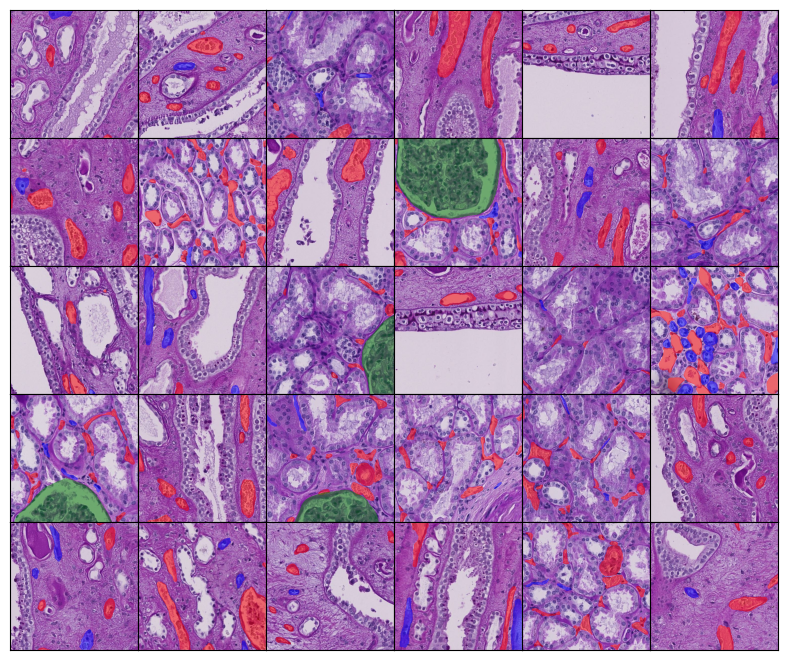

In [20]:
show_grid(dataset1_ids, annotations, class_color_dict)

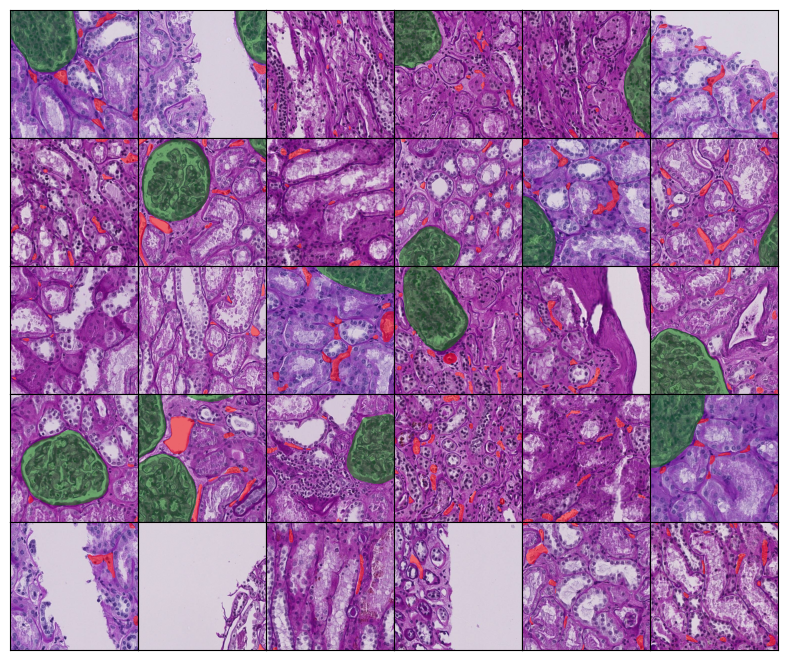

In [21]:
show_grid(dataset2_ids, annotations, class_color_dict)

> Instances from the `blood_vessel` class have high variability. Some are small and circular, others are large and elongated. This is expected since these are actually three types of structures: arterioles, capillaries, and venules. Furthermore, their appearence depends on the direction the tissue was sliced.   
> Images from `Dataset 1` have more `unsure` annotations. This is consistent with the fact that they have been expert reviewed. Images from `Dataset 2` seem to have more `glomerulus` annotations.   
> Other anatomical structures are present but are not annotated.  

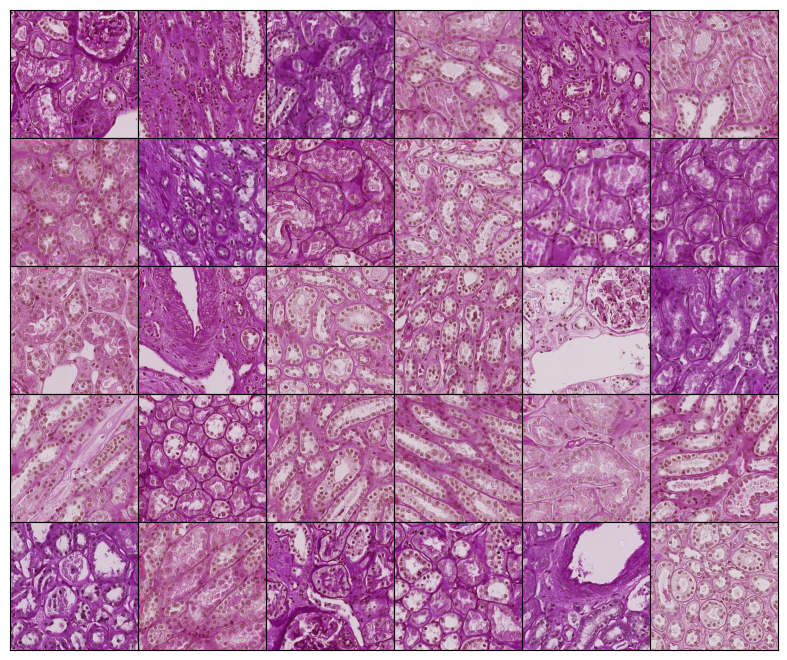

In [22]:
show_grid(dataset3_ids)

> We can see that images from `Dataset 3` are similar in content to images from `Dataset 1`  and `Dataset 2` and therefore could be useful in a semi-supervised learning appraoch.  
> Some images from `Dataset 3` are pinkish in hue. In order to have a robust model, we should incorporate color-based augmentation methods.

##  Stats from annotations

In [23]:
def get_polygons(identifiers, annotations, class_names):
    polygons = []
    for identifier in identifiers:
        polygons_list = []
        for (label, polygon) in annotations[identifier]:
            label_int = class_names.index(label)
            polygons_list.append([label_int, polygon])
        polygons.append(polygons_list)
    return polygons

In [24]:
def count_labels(polygons, class_names, normalize=False):
    counts = [0] * (len(class_names) - 1)
    for tile_annotation in polygons:
        for label, _ in tile_annotation:
            counts[label - 1] += 1
    if normalize:
        sum_counts = sum(counts)
        counts = [c / sum_counts for c in counts]
    return counts

In [25]:
num_annotations = []
for identifier in annotations.keys():
    polygons = get_polygons([identifier], annotations, class_names)
    num_annotations.append(count_labels(polygons, class_names)) 
num_annotations = np.array(num_annotations)

In [26]:
print("Average Number of Annotations per Image:", num_annotations.sum(axis=1).mean())
print("Average Number of Blood Vessels per Image:", num_annotations[:, 0].mean())
print("Average Number of Glomeruli per Image:", num_annotations[:, 1].mean())
print("Average Number of Unsure Annotations per Image:", num_annotations[:, 2].mean())

Average Number of Annotations per Image: 10.214329454990814
Average Number of Blood Vessels per Image: 9.359461114513167
Average Number of Glomeruli per Image: 0.30557256582976117
Average Number of Unsure Annotations per Image: 0.5492957746478874


In [27]:
polygons1 = get_polygons(dataset1_ids, annotations, class_names)
count_labels(polygons1, class_names)

[3497, 36, 872]

In [28]:
polygons2 = get_polygons(dataset2_ids, annotations, class_names)
count_labels(polygons2, class_names)

[11787, 463, 25]

## Transform Polygon Annotations into Masks 

In [29]:
def prepare_gt_semantic_seg(identifiers, annotations, class_names, erode=0, binary=False):
    """
    Transform polygon annotations into masks
    """        
    mask_shape = (IMG_SIZE, IMG_SIZE)
    masks, polygons = [], []
        
    for identifier in identifiers:
        
        labeled_mask = np.zeros(mask_shape, dtype="uint8")
        overlap = np.zeros(mask_shape, dtype="uint8")
        polygons_list = [] # [[label_int, polygon_list], ...]

        for (label, polygon) in annotations[identifier]:
            label_int = class_names.index(label)
            polygons_list.append([label_int, polygon])
            mask = skimage.draw.polygon2mask(mask_shape, polygon).T
            if erode:
                mask = skimage.morphology.erosion(mask, skimage.morphology.square(7))
                
            intersection = (labeled_mask * mask) > 0
            
            if intersection.sum():
                overlap += intersection
            
            labeled_mask += (label_int * mask).astype("uint8")
         
        # Overlap is treated as background
        labeled_mask[overlap > 0] = 0
        
        masks.append(labeled_mask)
        polygons.append(polygons_list)
    
    masks = np.array(masks) # (N, H, W)
    
    if binary:
        # One-Hot Encode 
        masks = np.eye(len(class_names), dtype=np.uint8)[masks] 
        masks = masks[:,:,:,1:] # (N, H, W, C)
    
    return masks, polygons

In [30]:
masks, polygons = prepare_gt_semantic_seg(dataset1_ids, annotations, class_names)

In [31]:
def show_grid_seperate(identifiers, masks, polygons, class_names,
                       nsamples=4, divide_by=2, transpose=False, dpi=100):
    if transpose:
        nrows, ncols = len(class_names) - 1, nsamples
    else:
        nrows, ncols = nsamples, len(class_names) - 1
        
    figsize = ((IMG_SIZE/divide_by)*ncols)/dpi, ((IMG_SIZE/divide_by)*nrows)/dpi
    fig, axs = plt.subplots(nrows, ncols, figsize=figsize, dpi=dpi)
    
    for i in range(nsamples):
        
        identifier = identifiers[i]
        path = Path(TRAIN_DIR) / f"{identifier}.{IMG_EXT}"
        img = PIL.Image.open(path).convert("RGB")
        mask = masks[i]
        polygons_list = polygons[i]
        
        for j in range(1, len(class_names)):
            
            ax = axs[j-1, i] if transpose else axs[i, j-1] 
            ax.imshow(img)
            
            # Multiclass Masks
            if mask.ndim == 2:
                ax.imshow((mask==j)*j, alpha=0.25, cmap="turbo", 
                          vmin=0, vmax=len(class_names),
                          interpolation="nearest")
            # Binary Masks
            elif mask.ndim == 3:
                ax.imshow(mask[:,:,j-1]*j, alpha=0.25, cmap="turbo", 
                          vmin=0, vmax=len(class_names), 
                          interpolation="nearest")
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_aspect("equal")
            
            for label, polygon in polygons_list:
                xx, yy = zip(*polygon)
                if label == j:
                    ax.fill(xx, yy, facecolor='none', edgecolor="orange", linewidth=1)
                else:
                    ax.fill(xx, yy, facecolor='none', edgecolor="orange", linewidth=1, linestyle="--")
    fig.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0)
    fig.show()

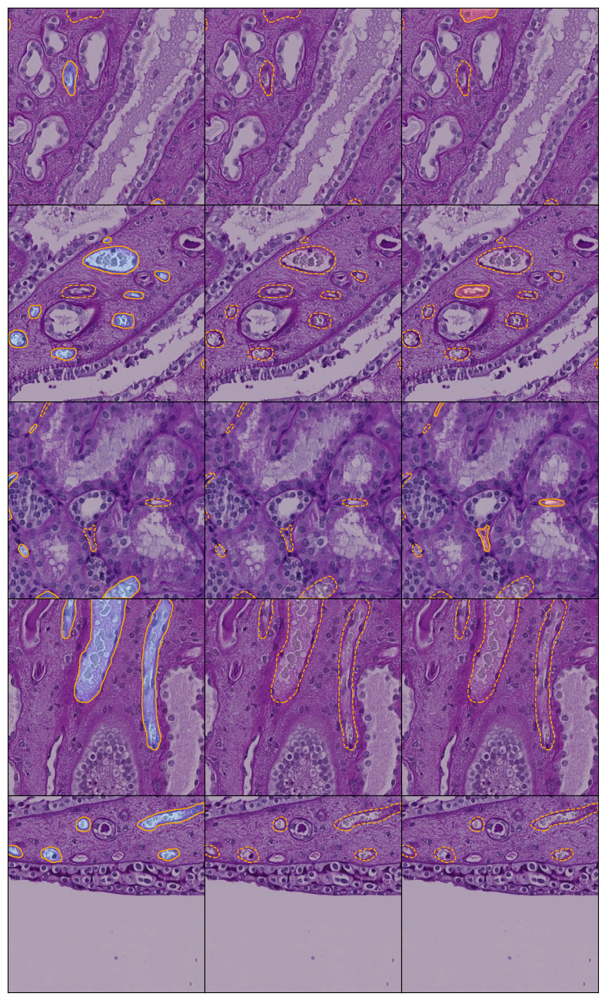

In [32]:
show_grid_seperate(dataset1_ids, masks, polygons, class_names, 5)

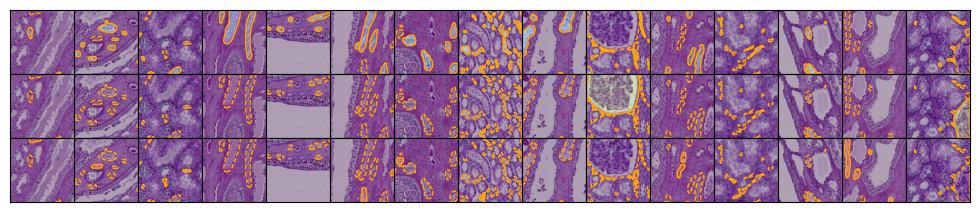

In [33]:
show_grid_seperate(dataset1_ids, masks, polygons, class_names, 15, 8, transpose=True)

## Inspect Sources

In [34]:
wsi_df = pd.read_csv(WSI_TILE_CSV)
# Consider only annotated tiles
wsi_df = wsi_df[wsi_df["dataset"] != 3] 

In [35]:
wsi_df["source"] = wsi_df[["dataset", "source_wsi"]].apply(tuple, axis=1)
source_combinations = [(1, 1), (1, 2), (2, 1), (2, 2), (2, 3), (2, 4)]
assert set(source_combinations) == set(wsi_df["source"].values)

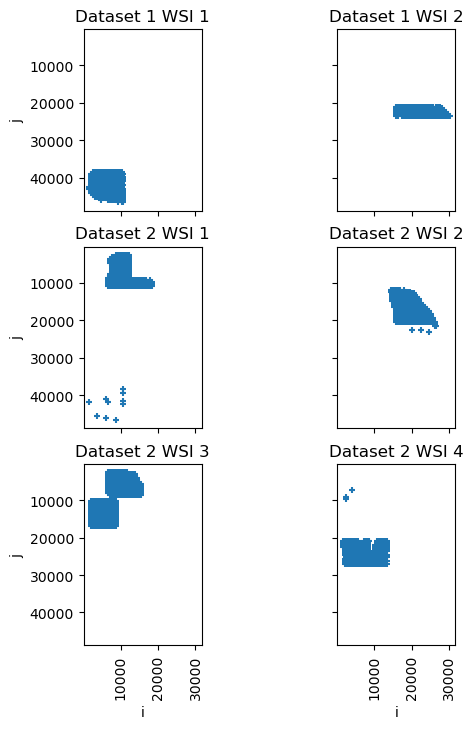

In [36]:
fig, axs = plt.subplots(nrows=3, ncols=2, sharex=True, sharey=True, figsize=[6, 8])
axs = axs.flatten()
axs[0].invert_yaxis()
for ax, source in zip(axs, source_combinations):
    wsi_df[wsi_df["source"]==source].plot.scatter(x="i", y="j", marker="+",
                                                  ax=ax, title=f"Dataset {source[0]} WSI {source[1]}")
    ax.set(aspect='equal')
    ax.tick_params(axis="x", labelrotation=90)

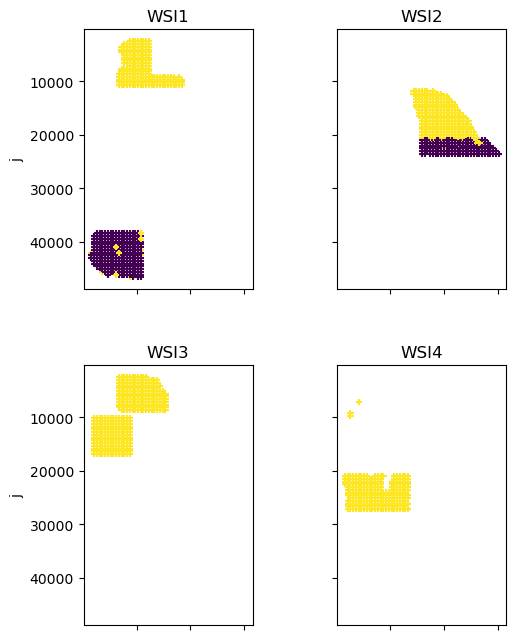

In [37]:
wsi_ids = set(wsi_df["source_wsi"].values)
fig, axs = plt.subplots(nrows=2, ncols=2, sharex=True, sharey=True, figsize=[6, 8])
axs = axs.flatten()
axs[0].invert_yaxis()
for wsi_id, ax in enumerate(axs, 1):
    wsi_df[wsi_df["source_wsi"]==wsi_id].plot.scatter(x="i", y="j", marker="+",
                                                      c="dataset", cmap="viridis",
                                                      vmin=1, vmax=2,
                                                      ax=ax, title=f"WSI{wsi_id}")
    ax.set(aspect='equal')
for cax in fig.get_axes()[len(fig.get_axes())//2:]:
    cax.remove()

> For testing the performance of our model, we should use tiles from `Dataset 1` because the annotations were expert reviewed. We should also make sure to have instances from both `WSI 1` and `WSI 2`.

## Splitting the data

In [38]:
def shuffle_sequence(seq):
    array = np.array(seq)
    np.random.shuffle(array)
    return array.tolist()

In [39]:
def retrieve_identifiers(wsi_df, source, shuffle=True):
    array = wsi_df[wsi_df["source"]==source].id.values.tolist()
    if shuffle:    
        return shuffle_sequence(array)
    return array

In [40]:
source11 = retrieve_identifiers(wsi_df, (1, 1))
source12 = retrieve_identifiers(wsi_df, (1, 2))
source21 = retrieve_identifiers(wsi_df, (2, 1))
source22 = retrieve_identifiers(wsi_df, (2, 2))
source23 = retrieve_identifiers(wsi_df, (2, 3))
source24 = retrieve_identifiers(wsi_df, (2, 4))


valid_ids = source11[:50] + source12[:50]
train_ids = source11[50:] + source12[50:] + source21 + source22 + source23 + source24

In [41]:
train_masks, train_polygons = prepare_gt_semantic_seg(train_ids, annotations, class_names)
valid_masks, valid_polygons = prepare_gt_semantic_seg(valid_ids, annotations, class_names)

In [42]:
count_labels(train_polygons, class_names)

[14408, 486, 672]

In [43]:
count_labels(valid_polygons, class_names)

[876, 13, 225]

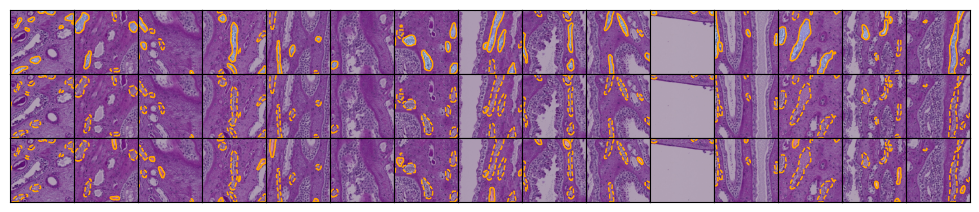

In [44]:
show_grid_seperate(train_ids, train_masks, train_polygons, class_names, 15, 8, transpose=True)

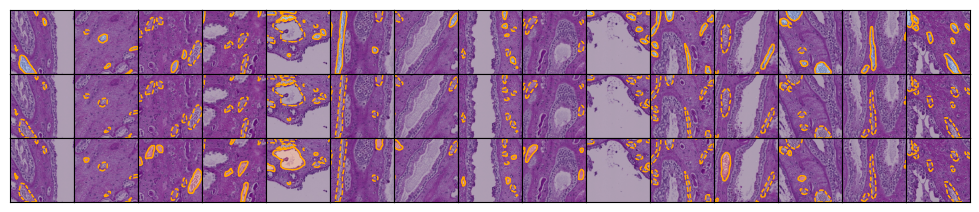

In [45]:
show_grid_seperate(valid_ids, valid_masks, valid_polygons, class_names, 15, 8, transpose=True)